In [51]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, VGG19, ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D


In [52]:
test_csv = '/Users/aradhya/Desktop/DeepLearning/!40kfaces/test.csv'
valid_csv = '/Users/aradhya/Desktop/DeepLearning/!40kfaces/valid.csv'
train_csv = '/Users/aradhya/Desktop/DeepLearning/!40kfaces/train.csv'

# Load the CSV files
train_df = pd.read_csv(train_csv)
valid_df = pd.read_csv(valid_csv)
test_df = pd.read_csv(test_csv)

# Check the first few rows of the training data
train_df.head()


,Unnamed: 0,original_path,id,label,label_str,path
0,0,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,31355,1,real,train/real/31355.jpg
1,1,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,02884,1,real,train/real/02884.jpg
2,2,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,33988,1,real,train/real/33988.jpg
3,3,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,53875,1,real,train/real/53875.jpg
4,4,/kaggle/input/flickrfaceshq-dataset-nvidia-par...,24149,1,real,train/real/24149.jpg


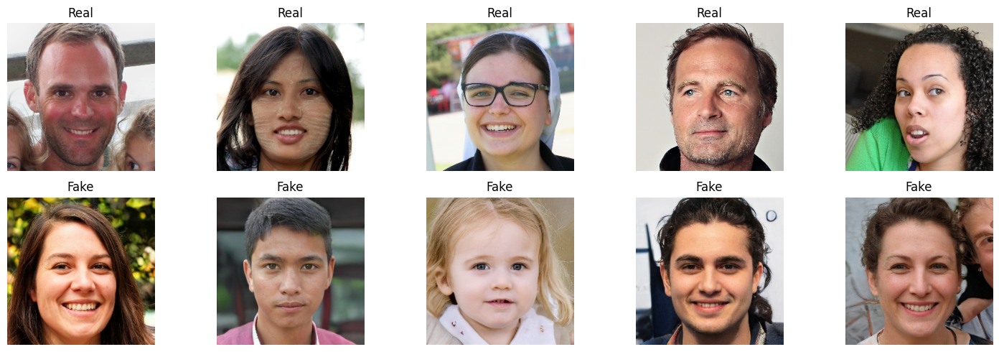

In [53]:
import os
import cv2
import matplotlib.pyplot as plt

# Set image size (for display only, no resizing or preprocessing)
img_size = (96, 96)  # You can adjust this size if necessary

# Base directory where images are stored
base_dir = r'real_vs_fake/real-vs-fake'

def load_images(folder, num_images=5):
    images = []
    count = 0
    for filename in os.listdir(folder):
        if count >= num_images:
            break
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(img)
            count += 1
    return images

real_folder = os.path.join(base_dir, 'train', 'real')
fake_folder = os.path.join(base_dir, 'train', 'fake')

real_images = load_images(real_folder)
fake_images = load_images(fake_folder)

# Display the images
fig, axes = plt.subplots(2, 5, figsize=(15, 5))
for i in range(5):
    # Display real images
    if len(real_images) > i:
        axes[0, i].imshow(real_images[i])  # No need to cast to uint8 here
        axes[0, i].axis('off')
        axes[0, i].set_title("Real")
    
    # Display fake images
    if len(fake_images) > i:
        axes[1, i].imshow(fake_images[i])  # No need to cast to uint8 here
        axes[1, i].axis('off')
        axes[1, i].set_title("Fake")

plt.tight_layout()
plt.show()


In [54]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16

# Load VGG16 without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(96, 96, 3))
base_model.trainable = False  # Freeze the base model

base_model.summary()  # Check the model structure


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 96, 96, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 96, 96, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 48, 48, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 48, 48, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 48, 48, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 24, 24, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 24, 24, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 12, 12, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 12, 12, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 12, 12, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 6, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 6, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 6, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 3, 3, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

In [55]:
from tensorflow.keras import layers, models

# Adding more layers with a dropout layer for regularization
model = models.Sequential([
    base_model,  # VGG16 base model
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),  # Increased number of units
    layers.Dropout(0.5),  # Dropout layer to prevent overfitting
    layers.Dense(256, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.summary()  # Check the complete model structure


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 3, 3, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,108,929 (57.64 MB)

 Trainable params: 394,241 (1.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [56]:
import pandas as pd

# Load the CSV file with image paths and labels
valid_df = pd.read_csv('valid.csv')
print(valid_df.head())  # Check the first few rows of the validation dataset


   Unnamed: 0                                      original_path     id  \
0           0  /kaggle/input/flickrfaceshq-dataset-nvidia-par...  20001   
1           1  /kaggle/input/flickrfaceshq-dataset-nvidia-par...  11264   
2           2  /kaggle/input/flickrfaceshq-dataset-nvidia-par...  19817   
3           3  /kaggle/input/flickrfaceshq-dataset-nvidia-par...  46851   
4           4  /kaggle/input/flickrfaceshq-dataset-nvidia-par...  10411   

   label label_str                  path  
0      1      real  valid/real/20001.jpg  
1      1      real  valid/real/11264.jpg  
2      1      real  valid/real/19817.jpg  
3      1      real  valid/real/46851.jpg  
4      1      real  valid/real/10411.jpg  


In [57]:
def valid_image_generator(df, batch_size=32):
    for i in range(0, len(df), batch_size):
        batch = df.iloc[i:i+batch_size]
        images = []
        labels = []
        
        for _, row in batch.iterrows():
            img_path = row['image_path']  # Assuming 'image_path' column holds image file paths
            label = row['label']  # Assuming 'label' column holds the labels (1 for real, 0 for fake)
            
            img, lbl = process_image(img_path, label)
            if img is not None:
                images.append(img)
                labels.append(lbl)
        
        # Convert to numpy arrays and return the batch
        yield np.array(images), np.array(labels)

# Create the validation dataset from the generator
val_dataset = tf.data.Dataset.from_generator(
    lambda: valid_image_generator(valid_df),
    output_signature=(
        tf.TensorSpec(shape=(None, img_size[0], img_size[1], 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None,), dtype=tf.int32)
    )
)
val_dataset = val_dataset.batch(32).prefetch(tf.data.AUTOTUNE)


In [58]:
import os
import pandas as pd

def create_csv_from_directory(base_dir):
    data = []
    labels = {"real": 1, "fake": 0}  # Assuming 1 for 'real' and 0 for 'fake'

    # Loop through each folder and get file paths
    for folder in ['train', 'valid', 'test']:  # Assuming the main directories are 'train', 'valid', 'test'
        for label in ['real', 'fake']:  # Two subfolders 'real' and 'fake'
            folder_path = os.path.join(base_dir, folder, label)
            for filename in os.listdir(folder_path):
                if filename.endswith('.jpg'):  # Assuming image format is jpg
                    data.append([os.path.join(folder, label, filename), labels[label]])

    # Convert the list into a pandas DataFrame
    df = pd.DataFrame(data, columns=['image_path', 'label'])
    df.to_csv('image_paths_labels.csv', index=False)  # Save to CSV
    return df

# Example usage
base_dir = r'real_vs_fake/real-vs-fake'  # Path to your 'real_vs_fake' directory
df = create_csv_from_directory(base_dir)


In [59]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the directory paths (CAPS COMMENT: INPUT YOUR DATASET PATHS HERE)
train_dir = r'real_vs_fake/real-vs-fake/train'  # CAPTURE YOUR TRAIN DIRECTORY PATH
valid_dir = r'real_vs_fake/real-vs-fake/valid'  # CAPTURE YOUR VALID DIRECTORY PATH
test_dir = r'real_vs_fake/real-vs-fake/test'    # CAPTURE YOUR TEST DIRECTORY PATH

# Image Preprocessing
image_size = (64, 64)  # Resizing the image to 150x150 for processing
batch_size = 32 # Batch size for training

# Create ImageDataGenerator objects for train, validation, and test
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Function to check if images exist
def check_image_exists(image_path):
    if not os.path.exists(image_path):
        print(f"File {image_path} not found.")
        return False
    return True

# Create the train dataset with image augmentation (if necessary)
train_dataset = train_datagen.flow_from_directory(
    r'real_vs_fake/real-vs-fake/train',  # CAPS COMMENT: INPUT TRAIN DIRECTORY PATH
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True  # Shuffle to ensure random distribution of images
)

# Create the validation dataset
val_dataset = val_datagen.flow_from_directory(
    r'real_vs_fake/real-vs-fake/valid',  # CAPS COMMENT: INPUT VALID DIRECTORY PATH
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)

# Create the test dataset
test_dataset = test_datagen.flow_from_directory(
    r'real_vs_fake/real-vs-fake/test',  # CAPS COMMENT: INPUT TEST DIRECTORY PATH
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)

# Train the model using the training dataset
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # Output layer for binary classification
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_dataset,
    epochs=20,
    validation_data=val_dataset,
    steps_per_epoch=1000,  # Lower the steps per epoch for faster testing
    validation_steps=1000  # Same for validation steps
)


# Evaluate the model on test data
test_loss, test_acc = model.evaluate(test_dataset, steps=len(test_dataset))
print(f"Test accuracy: {test_acc}")


Found 100000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.


/Users/aradhya/Desktop/DeepLearning/!40kfaces/.venv/lib/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/Users/aradhya/Desktop/DeepLearning/!40kfaces/.venv/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
 127/1000 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step - accuracy: 0.5199 - loss: 0.6993

KeyboardInterrupt: 

Found 20000 images belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


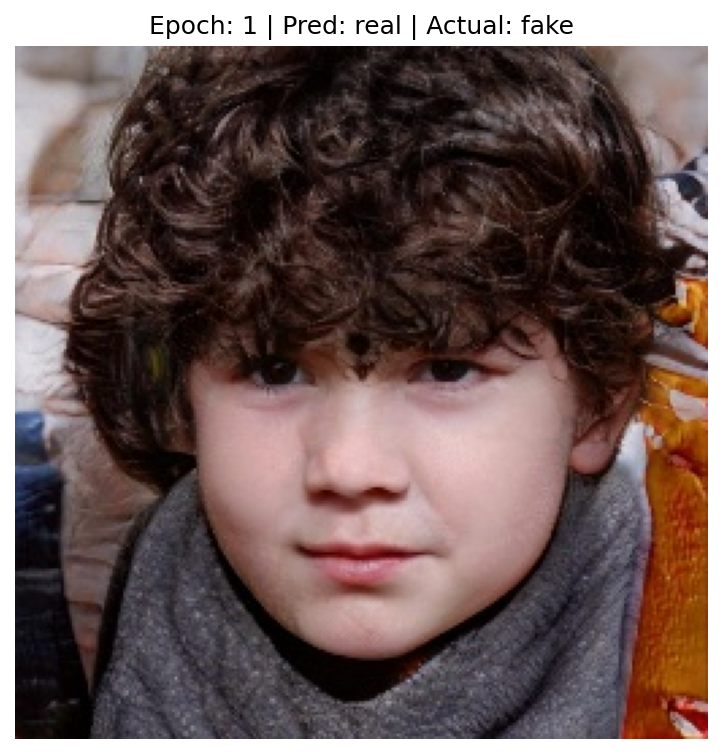

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


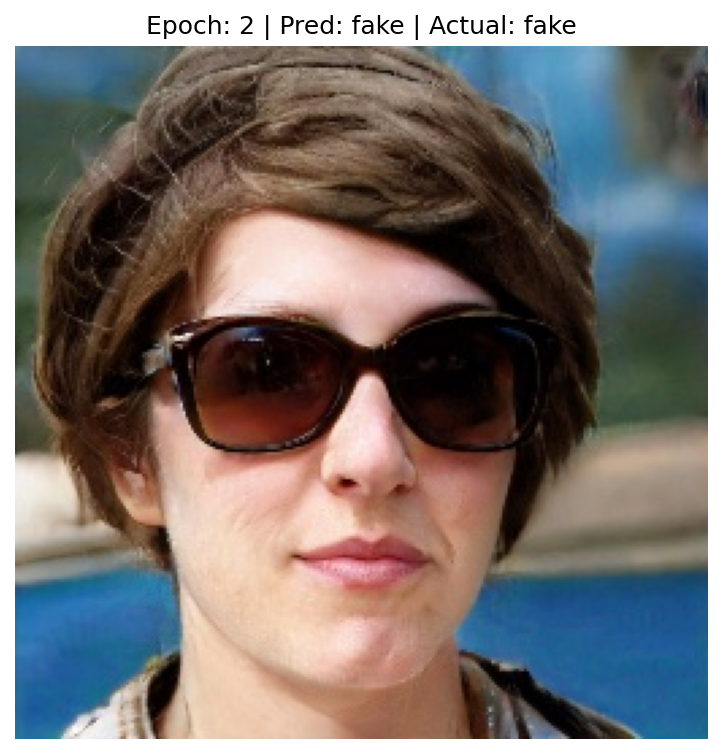

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


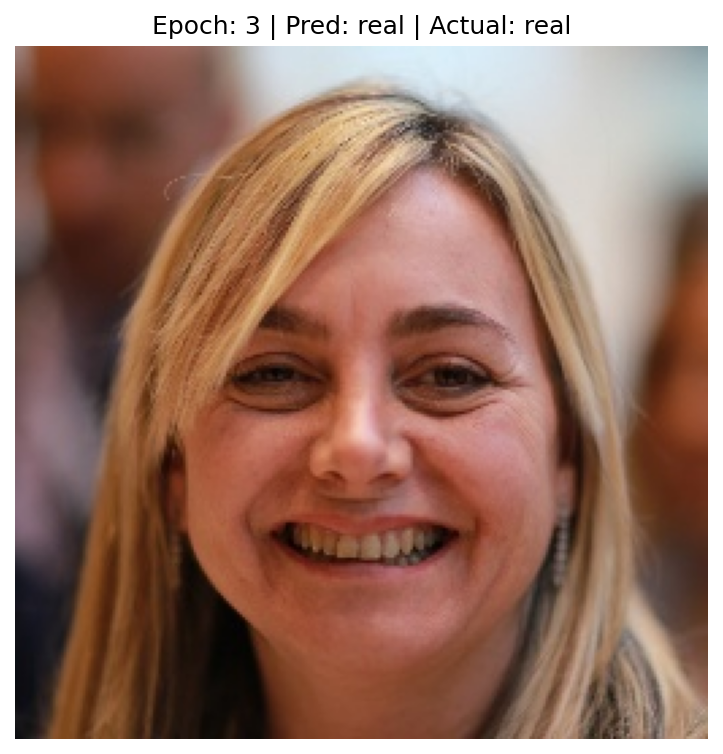

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


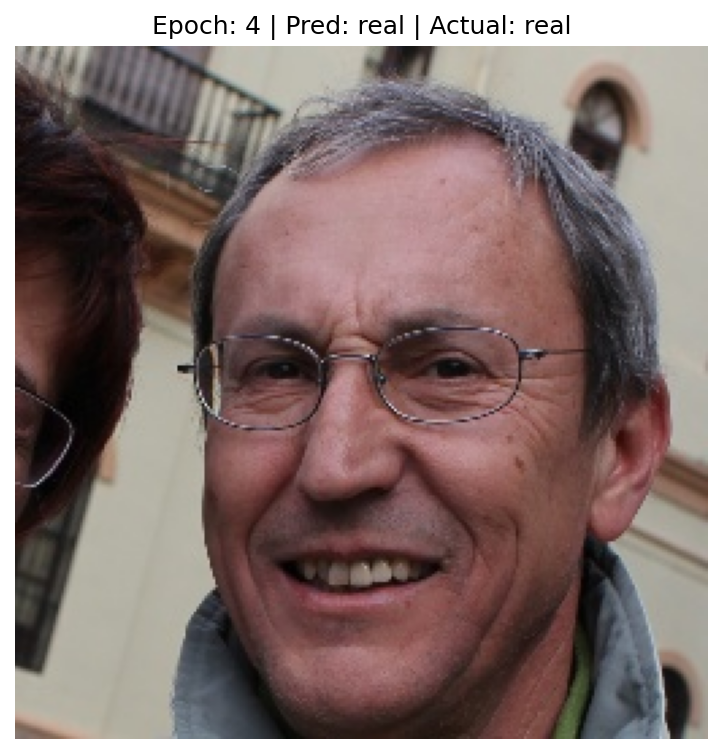

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


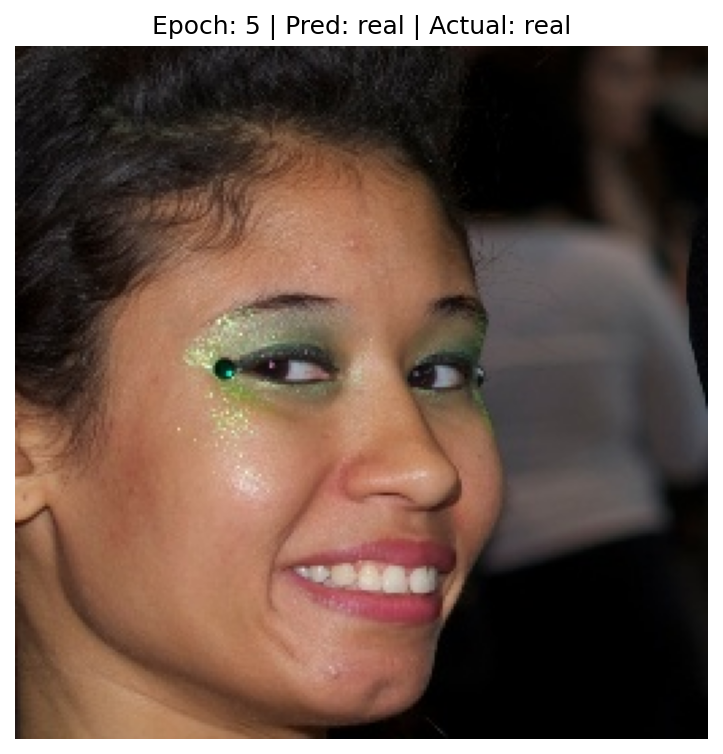

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


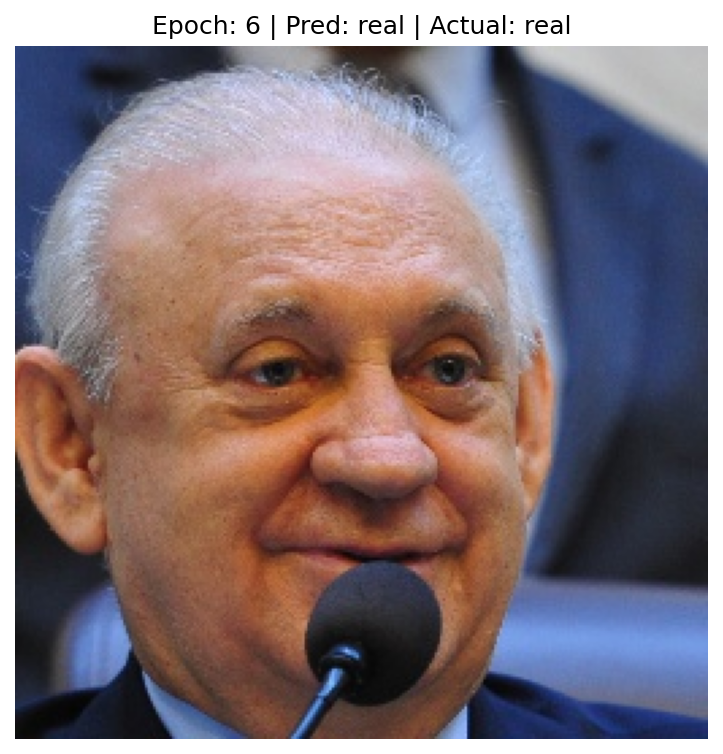

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


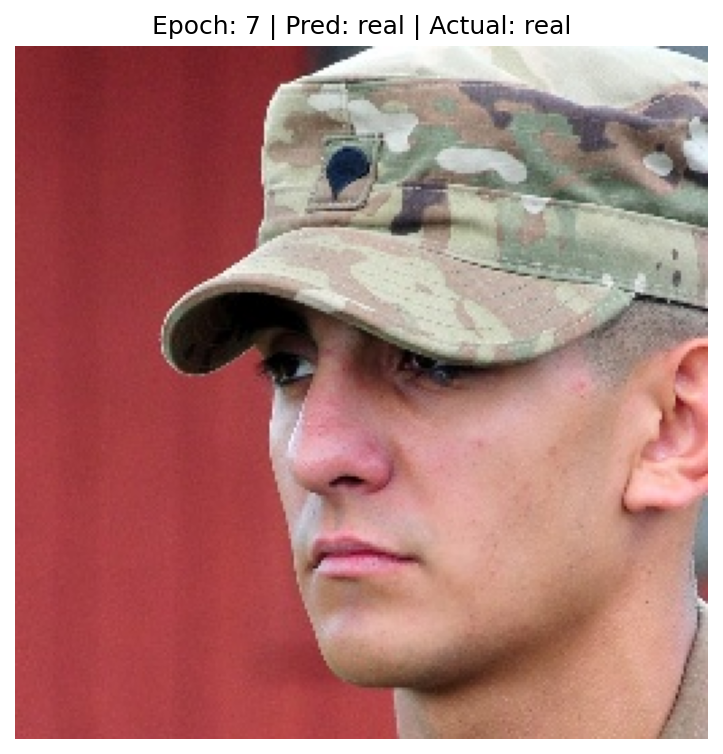

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


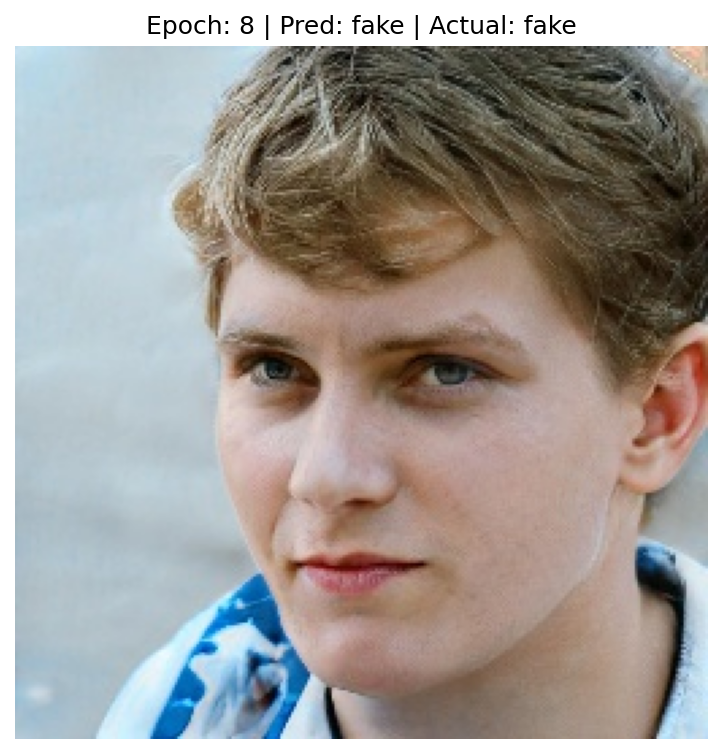

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


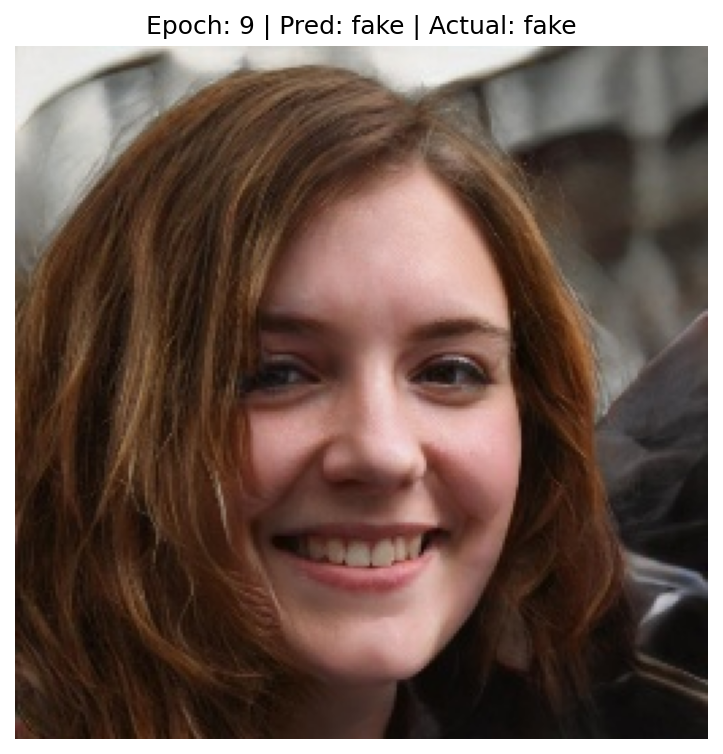

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


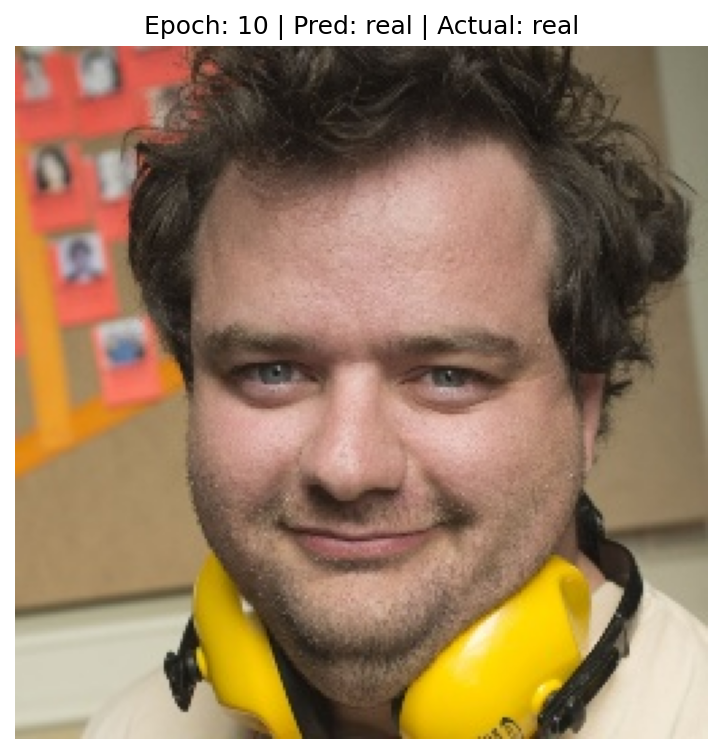

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


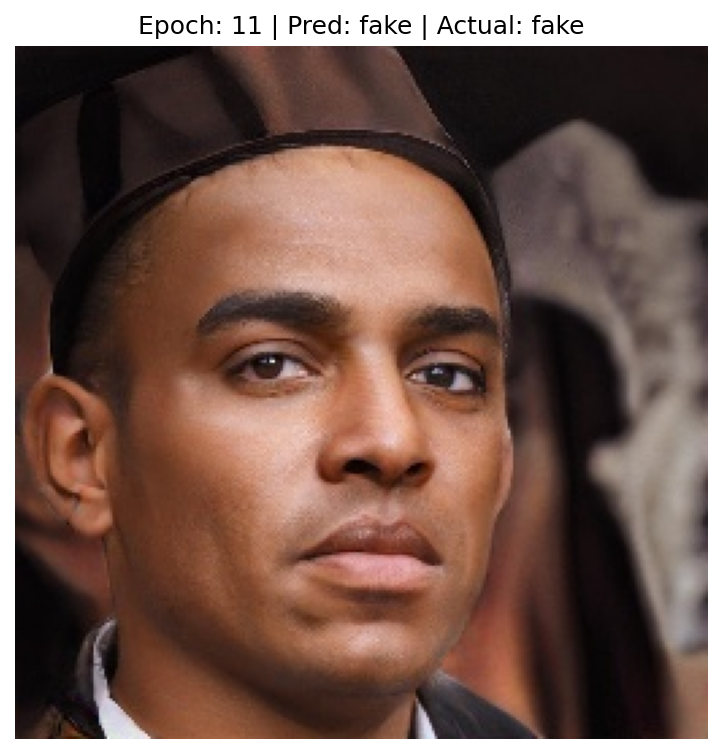

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


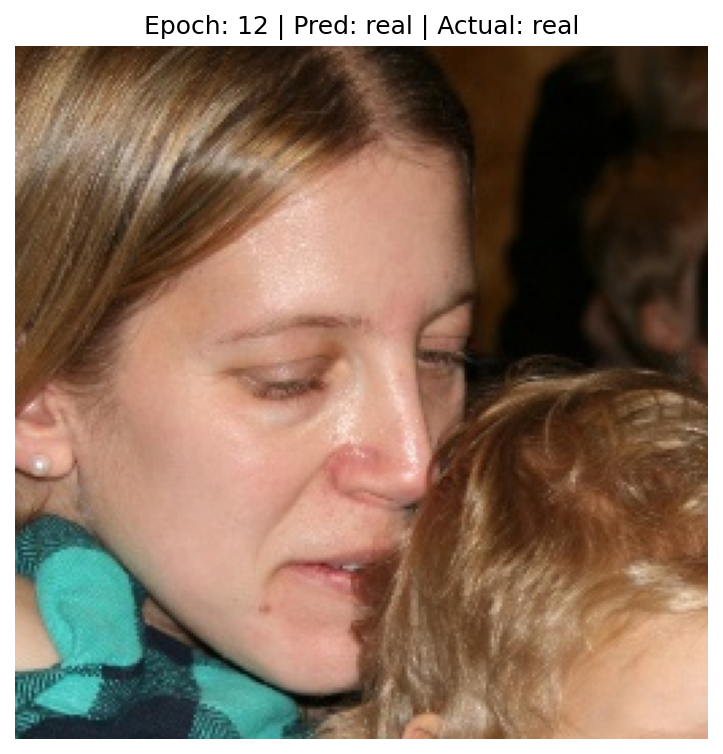

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


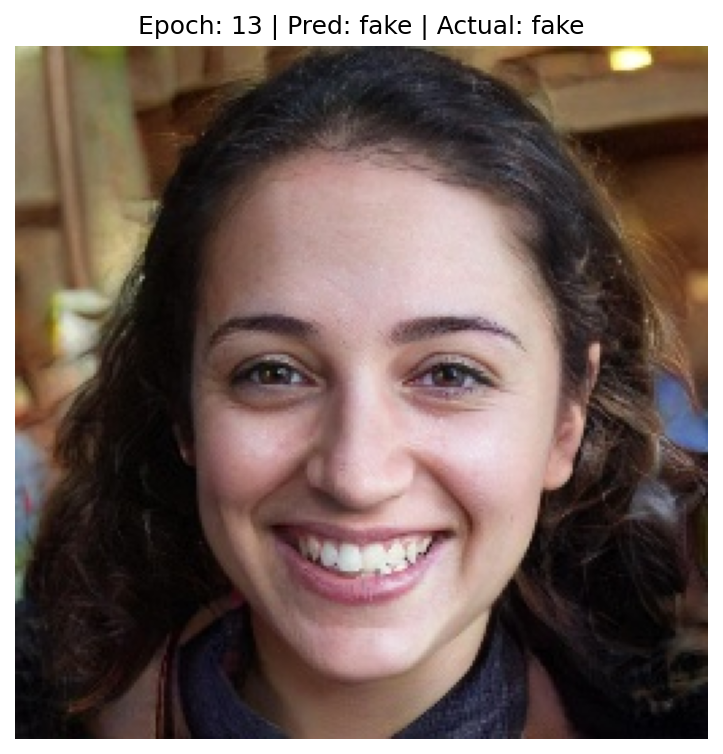

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


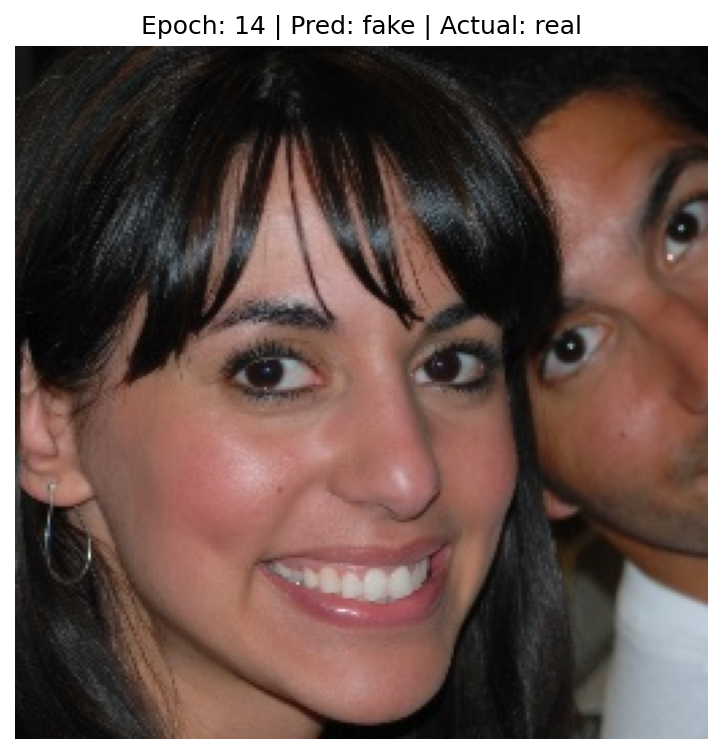

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


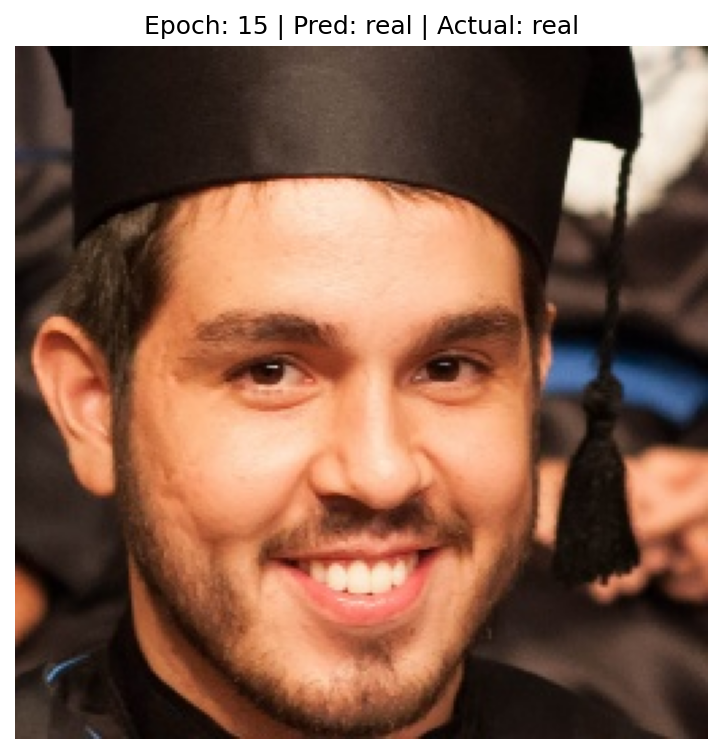

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


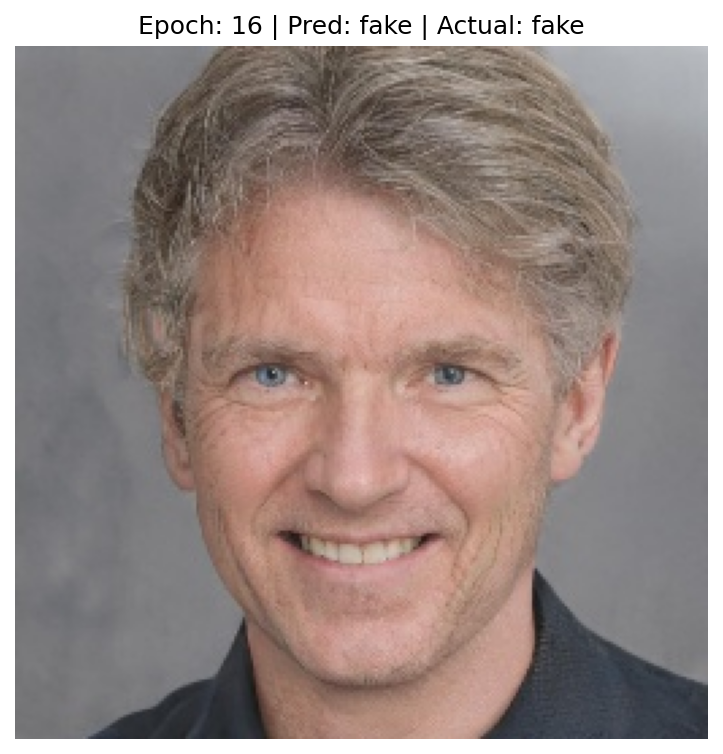

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


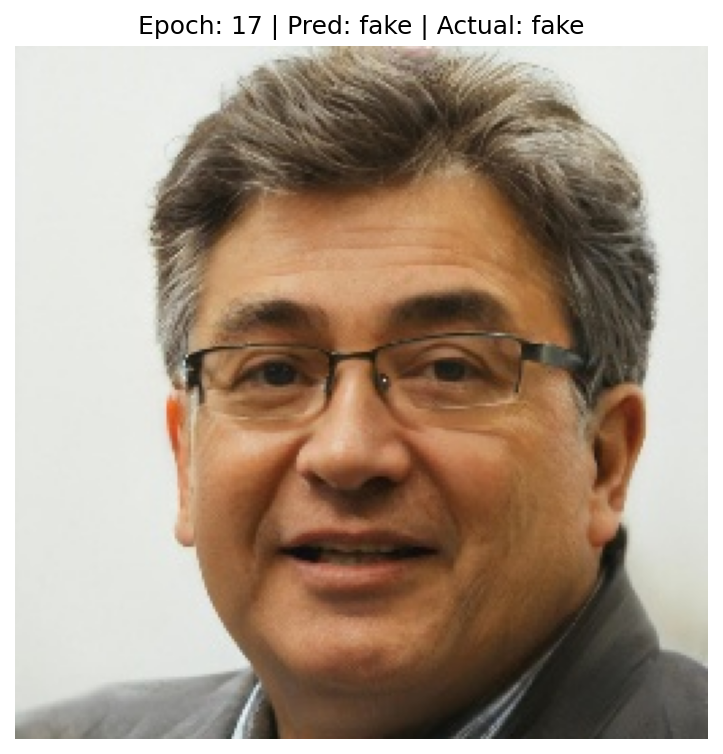

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


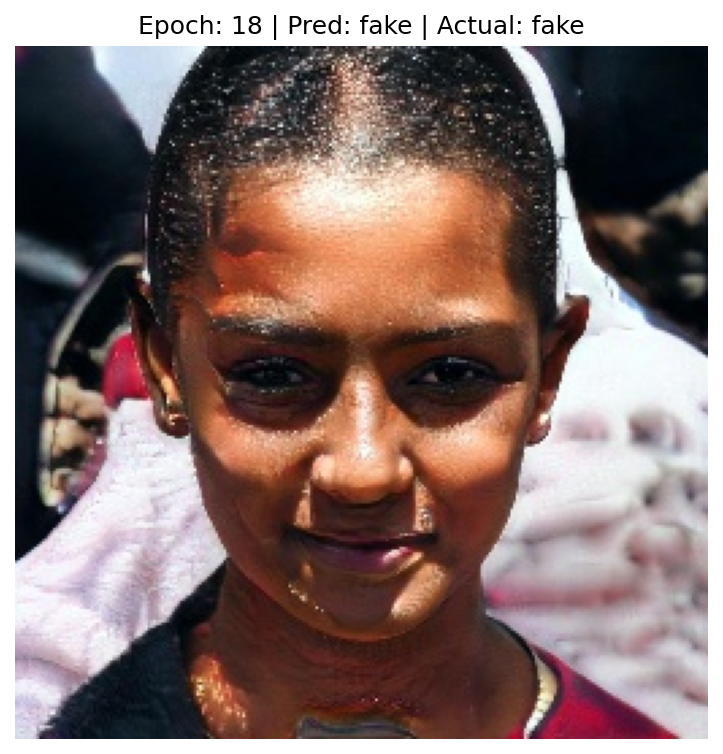

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


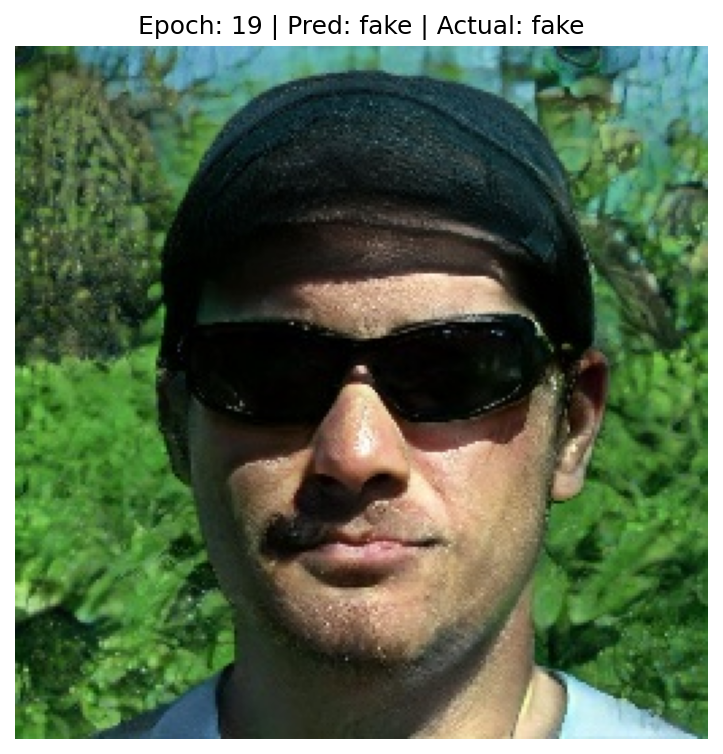

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


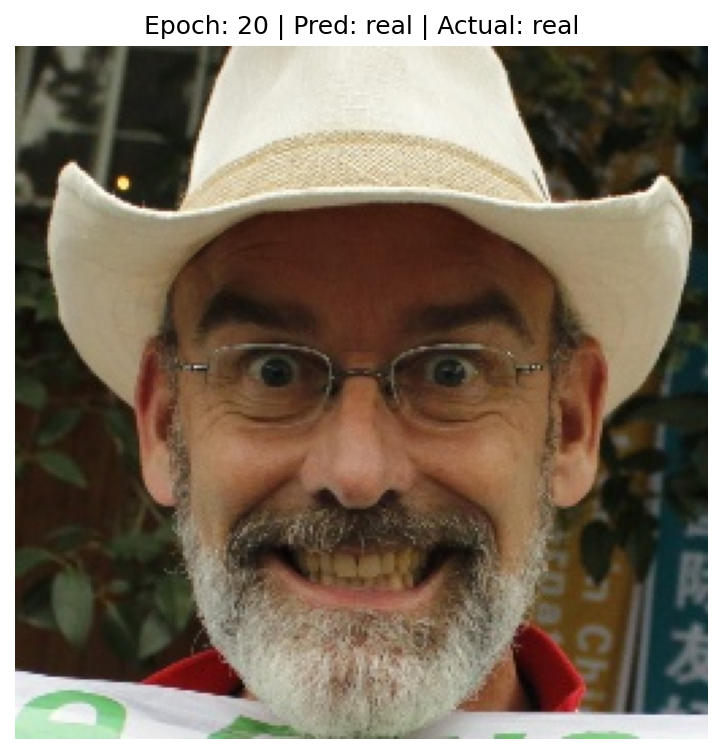


Total Correct: 18, Total Incorrect: 2


In [49]:
import os
import random
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Path to your 'test' directory that contains the 'real' and 'fake' subfolders
test_dir = r'real_vs_fake/real-vs-fake/test'

# Create a data generator for the test dataset
test_datagen = ImageDataGenerator(rescale=1./255)

# Load the test data
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(64, 64),  # Adjust based on your model's input size
    batch_size=10,
    class_mode='binary',
    shuffle=False  # Disable shuffling because we'll be selecting random files ourselves
)

# Get all filenames in the test set
all_filenames = test_generator.filenames

# Function to test the model on 20 random images without repetition
def test_model_on_random_images():
    correct_count = 0
    incorrect_count = 0

    # Randomly select 20 unique image indices from the dataset
    selected_indices = random.sample(range(len(all_filenames)), 20)

    for epoch, idx in enumerate(selected_indices, 1):
        img_path = all_filenames[idx]
        img_full_path = os.path.join(test_dir, img_path)

        # Load the image
        img = image.load_img(img_full_path, target_size=(64, 64))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = img_array / 255.0  # Normalize as per the model's expected input

        # Prediction
        prediction = model.predict(img_array)
        pred_label = 1 if prediction > 0.5 else 0

        # Get the true label from the file path
        true_label = test_generator.class_indices[img_path.split('/')[0]]  # Extract folder (real/fake) name

        # Display the original image with higher quality (using dpi for resolution)
        original_img = image.load_img(img_full_path)

        plt.figure(figsize=(6, 6), dpi=150)  # Higher DPI for better image clarity
        plt.imshow(original_img)
        plt.axis('off')
        plt.title(f"Epoch: {epoch} | Pred: {'real' if pred_label == 1 else 'fake'} | Actual: {'real' if true_label == 1 else 'fake'}")
        plt.show()

        # Count correct and incorrect predictions
        if pred_label == true_label:
            correct_count += 1
        else:
            incorrect_count += 1

    print(f"\nTotal Correct: {correct_count}, Total Incorrect: {incorrect_count}")

# Call the function
test_model_on_random_images()


In [67]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import Input

input_tensor = Input(shape=(64, 64, 3))  # Change input size
base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)

base_model.trainable = False  # Freeze pre-trained layers

# Add custom classification head
x = GlobalAveragePooling2D()(base_model.output)  # Ensure connection
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)  # Binary classification (Fake or Real)

# Define new model
model = Model(inputs=base_model.input, outputs=output)  # Ensure correct input-output mapping

# Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train model
history = model.fit(train_dataset, validation_data=val_dataset, epochs=20,steps_per_epoch=1000,  # Lower the steps per epoch for faster testing
    validation_steps=1000)  # Same for validation steps)





Epoch 1/20


/Users/aradhya/Desktop/DeepLearning/!40kfaces/.venv/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1377']
Received: inputs=Tensor(shape=(None, 64, 64, 3))
  warnings.warn(msg)


1000/1000 ━━━━━━━━━━━━━━━━━━━━ 383s 379ms/step - accuracy: 0.5225 - loss: 0.7146 - val_accuracy: 0.5713 - val_loss: 0.6758
Epoch 2/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 376s 376ms/step - accuracy: 0.5737 - loss: 0.6750 - val_accuracy: 0.6120 - val_loss: 0.6625
Epoch 3/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 370s 370ms/step - accuracy: 0.5873 - loss: 0.6676 - val_accuracy: 0.6077 - val_loss: 0.6609
Epoch 4/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 168s 168ms/step - accuracy: 0.5933 - loss: 0.6642 - val_accuracy: 0.6166 - val_loss: 0.6573
Epoch 5/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 371s 371ms/step - accuracy: 0.6061 - loss: 0.6618 - val_accuracy: 0.6184 - val_loss: 0.6541
Epoch 6/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 366s 366ms/step - accuracy: 0.6125 - loss: 0.6561 - val_accuracy: 0.6079 - val_loss: 0.6583
Epoch 7/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 373s 373ms/step - accuracy: 0.6118 - loss: 0.6538 - val_accuracy: 0.6233 - val_loss: 0.6488
Epoch 8/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 168s 168ms/step - accuracy: 0.6

In [60]:
print(labels.shape)  


(32,)
